In [3]:
import os
import torch
import pywt
import torchaudio.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from moviepy.video.io.VideoFileClip import VideoFileClip
import librosa
import numpy as np
from scipy.ndimage import maximum_filter
from scipy.ndimage import (generate_binary_structure, iterate_structure, binary_erosion)


In [4]:


class VideoDataset(Dataset):
    def __init__(self, file_path, cache_into_memory=False):
        self.file_path = file_path
        self.cache_into_memory = cache_into_memory
        self.name_list = self._get_video_names()

    def _get_video_names(self):
        return os.listdir(self.file_path)

    def __getitem__(self, index, frame_size=(144, 256)):
        video_name = os.path.join(self.file_path, self.name_list[index])
        video_clip = VideoFileClip(video_name)
        audio_clip = video_clip.audio
        sr = audio_clip.fps
        print(sr,"SR")
        audio_clip = audio_clip.to_soundarray()
        print(audio_clip.shape,"1")
        audio_clip = librosa.to_mono(audio_clip.T)
        audio_clip = audio_clip.reshape(1, -1)
        audio_clip = librosa.resample(audio_clip, orig_sr=sr, target_sr=5120)
        print(audio_clip.shape,"2")
        return audio_clip
    

    def __len__(self):
        return len(self.name_list)


In [5]:
videos = VideoDataset('../data/compressed_index/')

In [6]:
videos.name_list[0]

'023114a7952a10d21c3d5c177b5a8351.mp4'

In [7]:
audio = videos.__getitem__(0)


44100 SR
(72147600, 2) 1
(1, 8376320) 2


In [8]:
audio_slice = np.zeros((1, 200000))
audio_slice[0] = np.concatenate((audio[0,50000:100000],audio[0,250000:400000]))



In [9]:
from moviepy.audio.AudioClip import AudioArrayClip
audio1 = AudioArrayClip(audio.T, fps=5120*2)
audio2 = AudioArrayClip(audio_slice.T, fps=5120*2)

audio1.write_audiofile('test_1.wav')
audio2.write_audiofile('test_2.wav')

MoviePy - Writing audio in test_1.wav


MoviePy - Done.
MoviePy - Writing audio in test_2.wav


MoviePy - Done.


In [10]:
import matplotlib.pyplot as plt

In [11]:
def compute_constellation_map(Y, dist_freq=7, dist_time=7, thresh=0.01):
    """Compute constellation map (implementation using image processing)

    Notebook: C7/C7S1_AudioIdentification.ipynb

    Args:
        Y (np.ndarray): Spectrogram (magnitude)
        dist_freq (int): Neighborhood parameter for frequency direction (kappa) (Default value = 7)
        dist_time (int): Neighborhood parameter for time direction (tau) (Default value = 7)
        thresh (float): Threshold parameter for minimal peak magnitude (Default value = 0.01)

    Returns:
        Cmap (np.ndarray): Boolean mask for peak structure (same size as Y)
    """
    result = maximum_filter(Y, size=[2*dist_freq+1, 2*dist_time+1], mode='constant')
    Cmap = np.logical_and(Y == result, result > thresh)
    return Cmap

In [12]:
def get_spectrogram(Y, n_fft = 512, hop_length = 512):
    D = np.abs(librosa.stft(Y[0,:], n_fft=n_fft, hop_length=hop_length))
    S_db = librosa.amplitude_to_db(D, ref=np.max)
    if(S_db.min()<0):
        S_db = S_db - S_db.min()
    return S_db

In [13]:
def plot_peaks(peaks, sr = 5120):
  plt.figure(figsize=(12, 6))
  librosa.display.specshow(peaks[:,:], sr=sr, x_axis='s', y_axis='hz')
  plt.colorbar(format='%+2.0f dB')
  plt.title('Spectrogram')
  plt.tight_layout()
  plt.show()


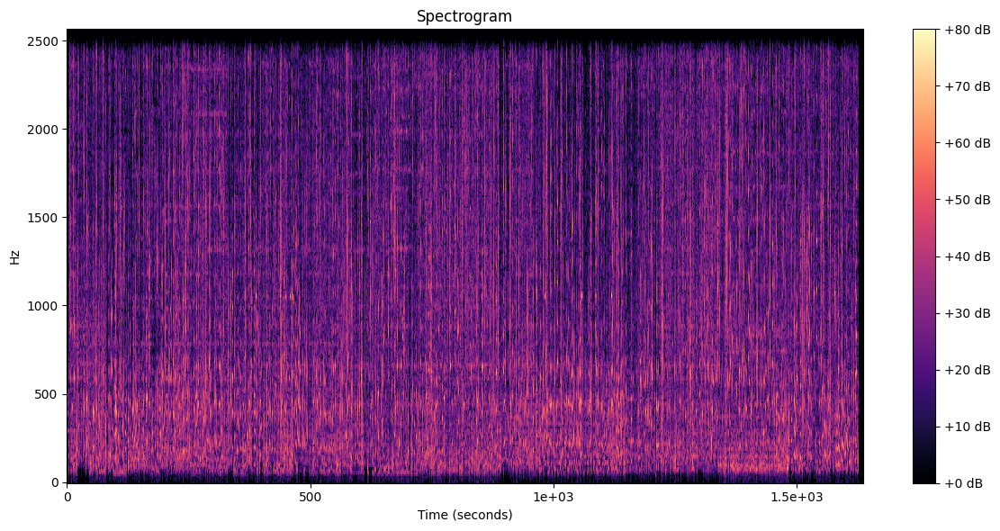

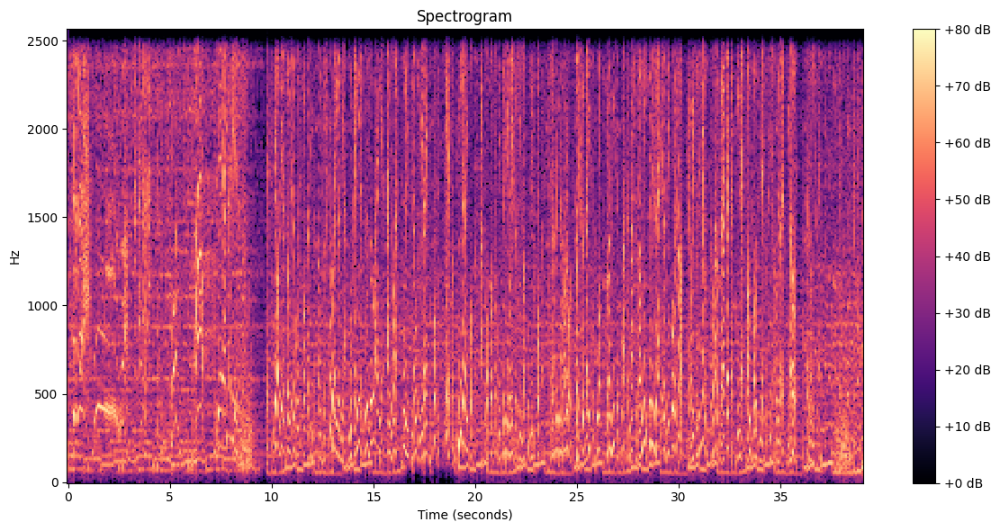

In [14]:
spec1 = get_spectrogram(audio)
spec2 = get_spectrogram(audio_slice)

plot_peaks(spec1)
plot_peaks(spec2)


# slice1 = slice_spectrogram(spec1)
# slice2 = slice_spectrogram(spec2)

# plot_peaks(slice1)
# plot_peaks(slice2)

In [15]:
def slice_spectrogram(S_db,min_freq = 300, max_freq = 2000):
  print(S_db.shape)
  res = S_db[min_freq/10:max_freq/10,:]
  return res
  

In [16]:
def get_peaks(peaks):
  peaks = peaks.astype(int)
  peaks = np.transpose(np.nonzero(peaks.T))
  return peaks

In [54]:
peaks_map_1 = compute_constellation_map(spec1,1,1)
peaks_map_2 = compute_constellation_map(spec2,1,1)

In [55]:
import random

def minhash(peaks, k=10, n = 32):
  def make_hashfunc():
    # create a random hash function
    a = random.randint(1, 1000)
    b = random.randint(1, 1000)
    p = 2147483647 # a large prime number
    def hashfunc(x):
        return (hash(x) * a + b) % p
    return hashfunc
  
  hashfunc = [make_hashfunc() for i in range(n)]
  signatures = []
  peaks = peaks.T
  print(peaks.shape)
  for i in range(0,peaks.shape[0],k):
    signature = {}
    for h in hashfunc:
      minhash = 0xFFFFFFFF
      data = peaks[i:i+10].flatten()
      for d in data:
        minhash = min(minhash, h(d))
      signature[h] = minhash
    signatures.append(signature)
  
  
  
  return signatures   
          

In [56]:
def jaccard(s1, s2):
    # calculate the Jaccard similarity coefficient between two signatures
    intersection = 0
    union = 0
    for k in s1:
        if k in s2:
            intersection += 1
        union += 1
    similarity = intersection / union
    return similarity

In [57]:
peaks1 = get_peaks(peaks_map_1)
peaks2 = get_peaks(peaks_map_2)

len(list(peaks2))
# plot_peaks(peaks1)
# plot_peaks(peaks2)


7562

In [62]:
minhash_1 = minhash(peaks_map_1,1,64)
minhash_2 = minhash(peaks_map_2,1,64)

(16361, 257)


KeyboardInterrupt: 

In [47]:
minhash_2[0]

{<function __main__.minhash.<locals>.make_hashfunc.<locals>.hashfunc(x)>: 142,
 <function __main__.minhash.<locals>.make_hashfunc.<locals>.hashfunc(x)>: 761,
 <function __main__.minhash.<locals>.make_hashfunc.<locals>.hashfunc(x)>: 860,
 <function __main__.minhash.<locals>.make_hashfunc.<locals>.hashfunc(x)>: 980,
 <function __main__.minhash.<locals>.make_hashfunc.<locals>.hashfunc(x)>: 820,
 <function __main__.minhash.<locals>.make_hashfunc.<locals>.hashfunc(x)>: 984,
 <function __main__.minhash.<locals>.make_hashfunc.<locals>.hashfunc(x)>: 335,
 <function __main__.minhash.<locals>.make_hashfunc.<locals>.hashfunc(x)>: 462,
 <function __main__.minhash.<locals>.make_hashfunc.<locals>.hashfunc(x)>: 920,
 <function __main__.minhash.<locals>.make_hashfunc.<locals>.hashfunc(x)>: 763,
 <function __main__.minhash.<locals>.make_hashfunc.<locals>.hashfunc(x)>: 398,
 <function __main__.minhash.<locals>.make_hashfunc.<locals>.hashfunc(x)>: 556,
 <function __main__.minhash.<locals>.make_hashfunc.<

In [61]:
for idx,values in enumerate(minhash_1):
  for idy,values2 in enumerate(minhash_2):
    if(jaccard(values, values2) > 0):
      print("Full sec: ", idx),
      print("Partial sec: ", idy),
      print("Jaccard: ", jaccard(values, values2))

Full sec:  0
Partial sec:  0
Jaccard:  1.0
Full sec:  0
Partial sec:  1
Jaccard:  1.0
Full sec:  0
Partial sec:  2
Jaccard:  1.0
Full sec:  0
Partial sec:  3
Jaccard:  1.0
Full sec:  0
Partial sec:  4
Jaccard:  1.0
Full sec:  0
Partial sec:  5
Jaccard:  1.0
Full sec:  0
Partial sec:  6
Jaccard:  1.0
Full sec:  0
Partial sec:  7
Jaccard:  1.0
Full sec:  0
Partial sec:  8
Jaccard:  1.0
Full sec:  0
Partial sec:  9
Jaccard:  1.0
Full sec:  0
Partial sec:  10
Jaccard:  1.0
Full sec:  0
Partial sec:  11
Jaccard:  1.0
Full sec:  0
Partial sec:  12
Jaccard:  1.0
Full sec:  0
Partial sec:  13
Jaccard:  1.0
Full sec:  0
Partial sec:  14
Jaccard:  1.0
Full sec:  0
Partial sec:  15
Jaccard:  1.0
Full sec:  0
Partial sec:  16
Jaccard:  1.0
Full sec:  0
Partial sec:  17
Jaccard:  1.0
Full sec:  0
Partial sec:  18
Jaccard:  1.0
Full sec:  0
Partial sec:  19
Jaccard:  1.0
Full sec:  0
Partial sec:  20
Jaccard:  1.0
Full sec:  0
Partial sec:  21
Jaccard:  1.0
Full sec:  0
Partial sec:  22
Jaccard:  1.

In [ ]:
from operator import itemgetter
import hashlib

In [ ]:

# Структура из списка хэшей: [sha1_hash[0:20] временное_смещение]
# например: [(e05b341a9b77a51fd26, 32), ... ]
def generate_hashes(peaks, sort = False, fan_value=15):
    IDX_FREQ_I = 0
    IDX_TIME_J = 1
    FINGERPRINT_REDUCTION = 20
    # для каждого пика
    for i in range(peaks.shape[0]):
      for j in range(1,fan_value):
        if i+j < peaks.shape[0]:
          # получим текущее и следующее пиковое значение частоты
          freq1 = peaks[i][IDX_FREQ_I]
          freq2 = peaks[i + j][IDX_FREQ_I]

          # получим текущее и следующее смещение времени пика
          t1 = peaks[i][IDX_TIME_J]
          t2 = peaks[i + j][IDX_TIME_J]

          # получим разницу по времени
          t_delta = t2 - t1

          # если разница между минимум и максимом считаем хэш
          if t_delta >= 0 and t_delta <= 100:
            seq = str(freq1)+"|"+str(freq2)+"|"+str(t_delta)
            h = hashlib.sha1(seq.encode('utf-8'))
            # обрезаем хэш
            yield (h.hexdigest()[0:FINGERPRINT_REDUCTION], t1)

In [ ]:
def fingerprint(samples):
    spec = get_spectrogram(samples)
    peaks_map = compute_constellation_map(spec)
    peaks = get_peaks(peaks_map)
    return generate_hashes(peaks, sort = False, fan_value=35)

In [ ]:
f1 = fingerprint(audio)
f2 = fingerprint(audio_slice)
whole_song = set(f1)
part_song = set(f2)



In [ ]:
mapper1 = {}
for hash, offset in whole_song:
    mapper1[hash.upper()] = offset
values1 = mapper1.keys()


In [ ]:
len(values2)

162615

7


In [ ]:
from termcolor import colored

In [ ]:
def return_matches(hashes, storage: map):
    mapper = {}
    for hash, offset in hashes:
      mapper[hash.upper()] = offset
    values = mapper.keys()
    for split_value in values:
      if split_value.upper() in storage:
        yield (1, storage[split_value.upper()] - mapper[split_value])

In [ ]:
def align_matches(matches):
   for match in matches:
     

In [ ]:
matches = return_matches(part_song,mapper1)
matches = list(matches)

In [ ]:
total_matches_found = len(list(matches))


print("")

if total_matches_found > 0:
  msg = ' ** totally found %d hash matches'
  print( colored(msg, 'green') % total_matches_found)

  song = align_matches(matches)

  msg = ' => song: %s (id=%d)\n'
  msg += '    offset: %d (%d secs)\n'
  msg += '    confidence: %d'

  print( colored(msg, 'green') % (
    song['SONG_NAME'], song['SONG_ID'],
    song['OFFSET'], song['OFFSET_SECS'],
    song['CONFIDENCE']
  ))
# else:
#   msg = ' ** not matches found at all'
#   print( colored(msg, 'red'))


 ** totally found 7 hash matches
1 -42
1 68
1 79
1 189
1 13
1 -14
1 -36
-4.2
 => song: 1 (id=1)
    offset: -42 (-4 secs)
    confidence: 1


In [ ]:
import hashlib

In [ ]:
def first_nonzero(arr, axis, invalid_val=-1):
    mask = arr!=0
    ret = np.where(mask.any(axis=axis), mask.argmax(axis=axis), invalid_val)
    return ret

In [ ]:
def minhash_signature(peaks, num_permutations = 64):
  signatures = []
  peaks = np.uint8(peaks)
  for i in range(num_permutations):
    rand = peaks[:,np.random.permutation(peaks.shape[1])]
    signatures.append(first_nonzero(rand, 0,-1))
  return signatures
    

In [ ]:
def jaccard(x1, x2):
  return len(np.intersect1d(x1, x2)) / len(np.union1d(x1, x2))

In [ ]:
minH1 = np.array(minhash_signature(peaks1,16)).T
minH2 = np.array(minhash_signature(peaks2,16)).T



In [ ]:
for idx, x in enumerate(minH1):
  for idy, y in enumerate(minH2):
    j = jaccard(x,y)
    if(j > 0.7):
      print("Full frame: ", idx),
      print("Partial frame: ", idy),
      print("Jaccard: ", j)

Full frame:  2434
Partial frame:  47
Jaccard:  0.75
Full frame:  10375
Partial frame:  73
Jaccard:  0.75
Full frame:  14142
Partial frame:  79
Jaccard:  0.8
Full frame:  15317
Partial frame:  93
Jaccard:  0.75


In [ ]:
def compare_simhashes(x1, x2):
  int_x1 = int(x1,32)
  int_x2 = int(x2,32)
  return bin(int_x1 ^ int_x2).count("1")

In [ ]:
def compare_simhashes_bytes(x1, x2):
  return bin(int.from_bytes(x1, byteorder='big') ^ int.from_bytes(x2, byteorder='big')).count("1")

In [ ]:
def simhash2(peaks, frame_split):
  simhashes = []
  counter = 0
  token_hash = np.zeros(peaks.shape[0])
  peaks = peaks.astype(int)
  for i in peaks.T:
    token_hash += np.where(i > 0, 1, -1)
    if counter % frame_split == 0:
      simhashes.append(np.where(token_hash >= 0, 1, 0))
  if(len(token_hash) > 0):
    simhashes.append(np.where(token_hash >= 0, 1, 0))
  return simhashes

In [ ]:
def simhash(peaks, frame_split):
  simhashes = []
  counter = 0
  tokens = []
  peaks = peaks.astype(int)
  for i in peaks.T:
    # if np.count_nonzero(i) == 0:
    #   continue
    tokens.append(hashlib.md5(i.tostring()).hexdigest())
    if counter % frame_split == 0:
      simhash = 0
      for x in tokens:
        simhash ^= int(x,32)
      simhash_hex = format(simhash, 'x')
      simhashes.append(simhash_hex)
      tokens = []
      counter = 0
    counter += 1
  if len(tokens) > 0:
    simhash = 0
    for x in tokens:
      simhash ^= int(x,32)
    simhash_hex = format(simhash, 'x')
    simhashes.append(simhash_hex)
  
  return simhashes



In [ ]:
s1 = simhash2(peaks1, 10)
s2 = simhash2(peaks2, 10)

In [ ]:
len(s2)

99

In [ ]:
s1 = np.packbits(s1,axis=1)
s2 = np.packbits(s2,axis=1)

In [ ]:
print(np.count_nonzero(np.sum(s2,axis=1)))

88


In [ ]:
len(s2)

99

In [ ]:
for idx, x in enumerate(s2):
  for idy, y in enumerate(s1):
    comp = compare_simhashes_bytes(x,y)
    if(comp < 2):
      print(idx, idy, comp)

60 18 1
60 19 1
60 20 1
60 21 1
60 22 1
60 23 1
60 24 1
60 25 1
60 26 1
60 27 1
60 28 1
60 29 1
60 30 1
60 31 1
60 32 1
60 33 1
60 34 1
60 35 1
60 36 1
60 37 1
60 38 1
60 39 1
60 40 1
60 41 1
60 42 1
60 43 1
60 44 1
60 45 1
60 46 1
60 47 1
60 48 1
60 49 1
60 50 1
60 51 1
60 52 1
60 53 1
60 54 1
60 55 1
60 56 1
60 57 1
60 58 1
60 59 1
60 60 1
60 61 1
60 62 1
60 63 1
60 64 1
60 65 1
60 66 1
60 67 1
60 68 1
60 69 1
60 70 1
60 71 1
60 72 1
60 73 1
60 74 1
60 75 1
60 76 1
60 77 1
60 78 1
60 79 1
60 80 1
60 81 1
60 82 1
60 83 1
60 84 1
60 85 1
60 86 1
60 87 1
60 88 1
60 89 1
60 90 1
60 91 1
60 92 1
60 93 1
60 94 1
60 95 1
60 96 1
60 97 1
60 98 1
60 99 1
60 100 1
60 101 1
60 102 1
60 103 1
60 104 1
60 105 1
60 106 1
60 107 1
60 108 1
60 109 1
60 110 1
60 111 1
60 112 1
60 113 1
60 114 1
60 115 1
60 116 1
60 117 1
60 118 1
60 119 1
60 120 1
60 121 1
60 122 1
60 123 1
60 124 1
60 125 1
60 126 1
60 127 1
60 128 1
60 129 1
60 130 1
60 131 1
60 132 1
60 133 1
60 134 1
60 135 1
60 136 1
60 137 1
60

TypeError: only integer scalar arrays can be converted to a scalar index

In [ ]:
from moviepy.audio.AudioClip import AudioArrayClip
audio1 = AudioArrayClip(audio.T, fps=11000)

In [ ]:
audio1.write_audiofile('test.wav')


                                                             

                                                                


                                                       
chunk: 100%|██████████| 1/1 [19:54<00:00, 1194.54s/it, now=None]



MoviePy - Writing audio in test.wav
























                                                             

                                                                


                                                       
chunk: 100%|██████████| 1/1 [19:55<00:00, 1195.11s/it, now=None]



MoviePy - Done.
